### Age-aware atlas formation

In [13]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [14]:
import os,sys
import numpy as np 
import pandas as pd
import scanpy as sc
from datetime import datetime
import matplotlib.pyplot as plt

import matplotlib
import seaborn as sns

In [15]:
## import utils
cwd = '../utils/'
sys.path.append(cwd)

In [16]:
import directed_bbknn

### Load data for Lymphoid subset

In [19]:
new_obs = pd.read_csv("/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.full_obs.csv", index_col=0)

In [ ]:
adata = sc.read_h5ad("/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_normalised_log.wGut.batchCorrected_20210118.LYMPHOID.batchCorrected.h5ad")

In [20]:
adata.obs = pd.concat([new_obs.loc[adata.obs_names], adata.obs[["leiden_100", "leiden_150"]]], 1)

## Visualize transition matrix

... storing 'Sample' as categorical
... storing 'donor' as categorical
... storing 'organ' as categorical
... storing 'file' as categorical
... storing 'predicted_doublets' as categorical
... storing 'name' as categorical
... storing 'batch' as categorical
... storing 'bbk' as categorical
... storing 'uniform_label' as categorical
... storing 'uniform_label_expanded_merged' as categorical
... storing 'uniform_label_lvl0' as categorical
... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'method' as categorical
... storing 'sex' as categorical
... storing 'Processing_method' as categorical
... storing 'AnnatomicalPart' as categorical


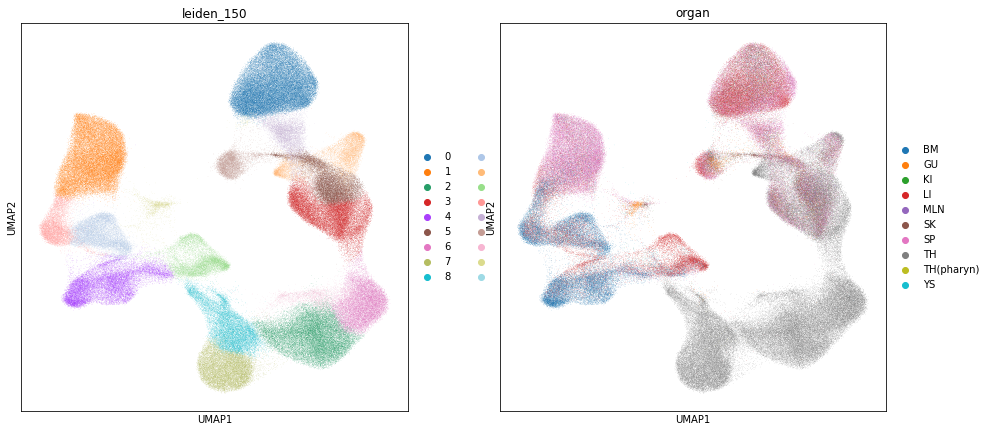

In [21]:
plt.rcParams["figure.figsize"] = [7,7]
sc.pl.umap(adata, color=["leiden_150", "organ"])



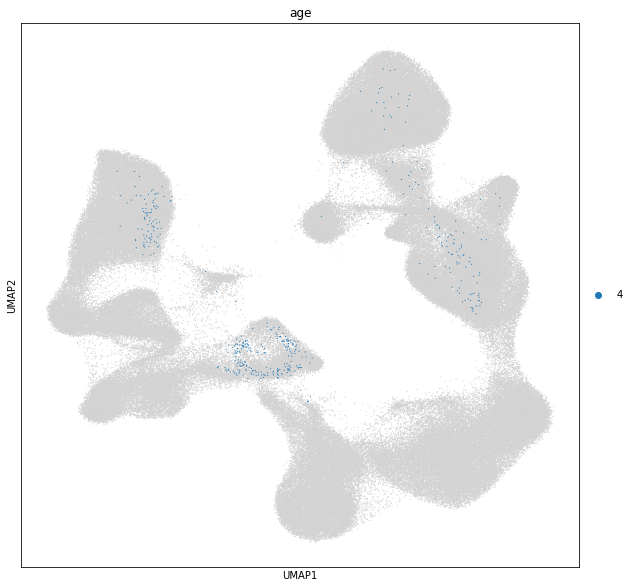

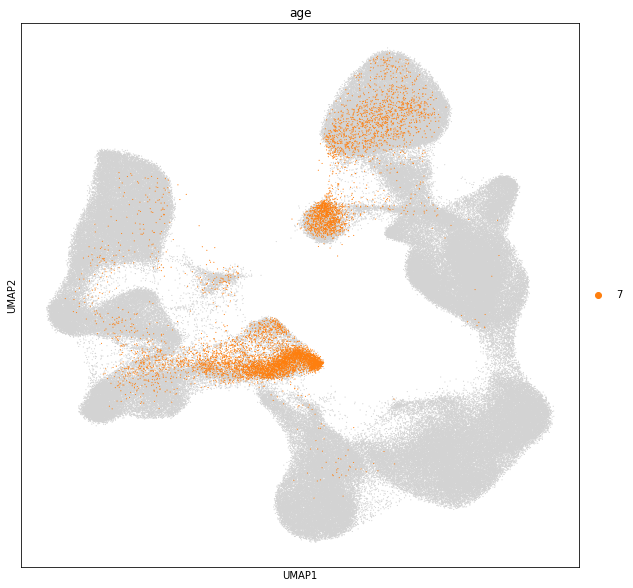

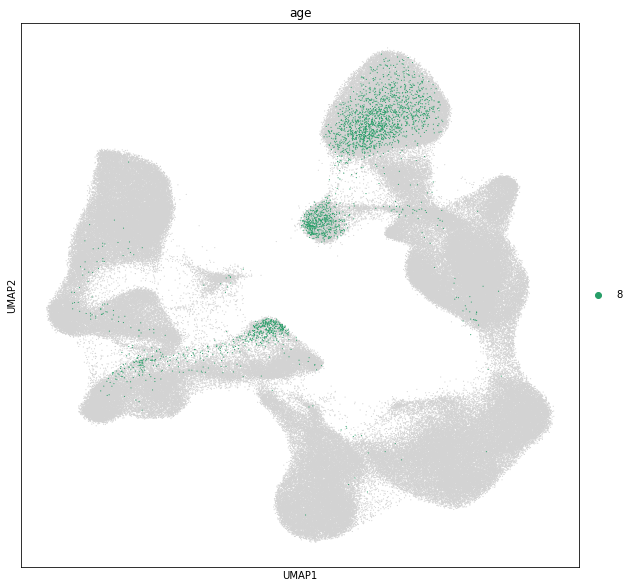

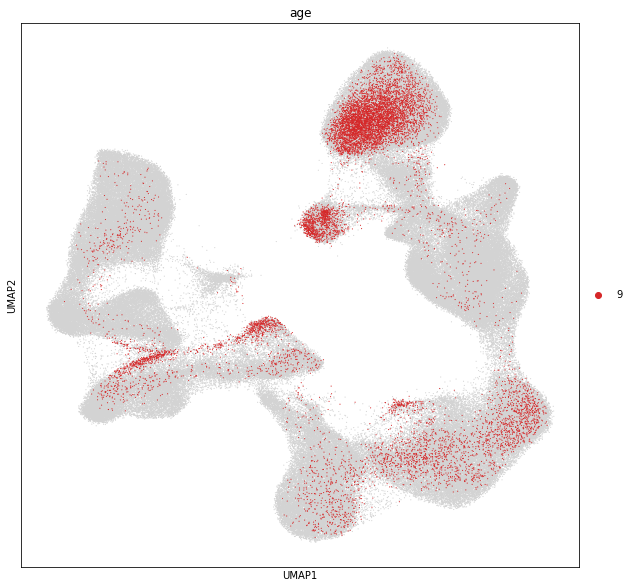

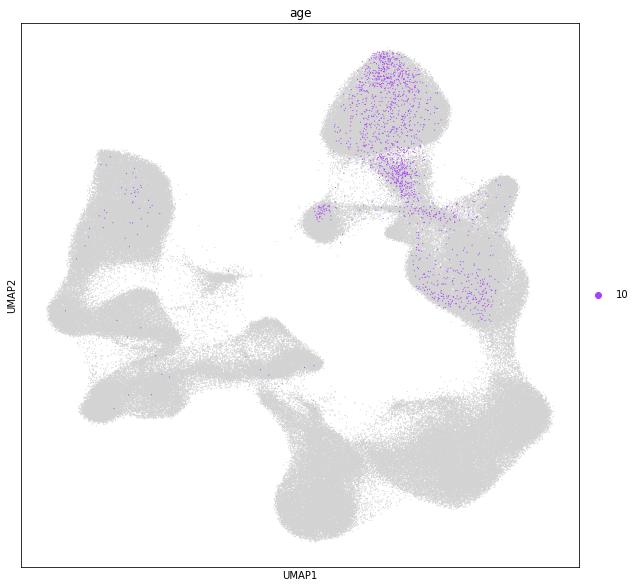

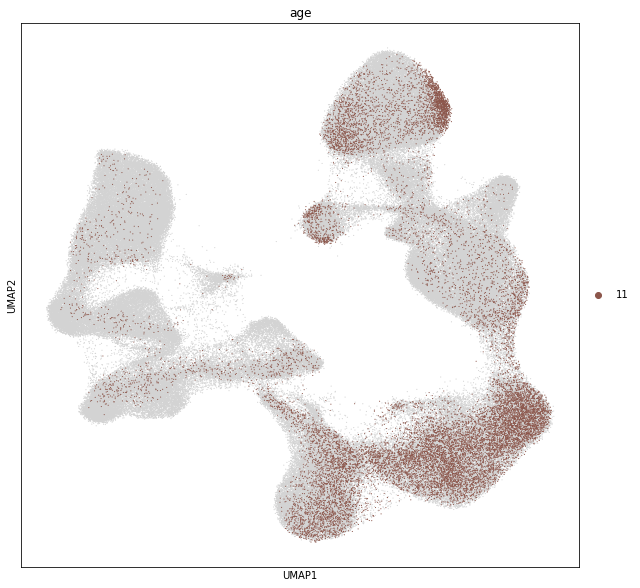

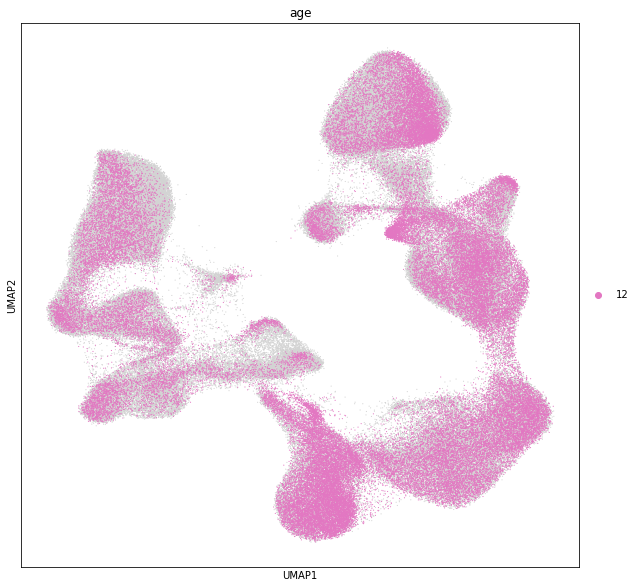

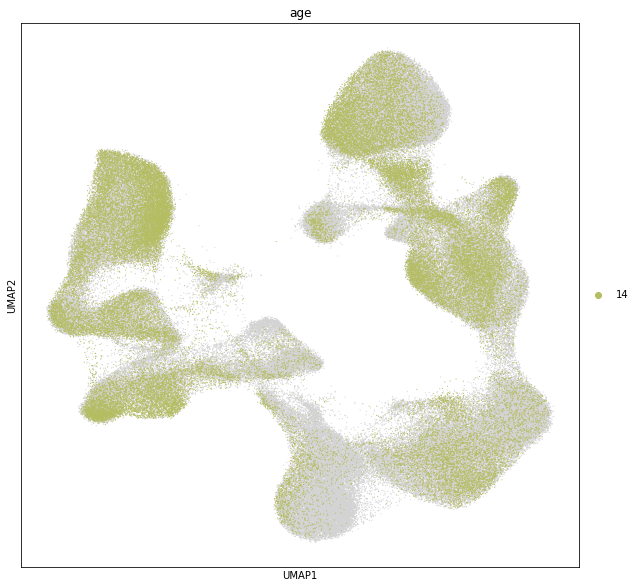

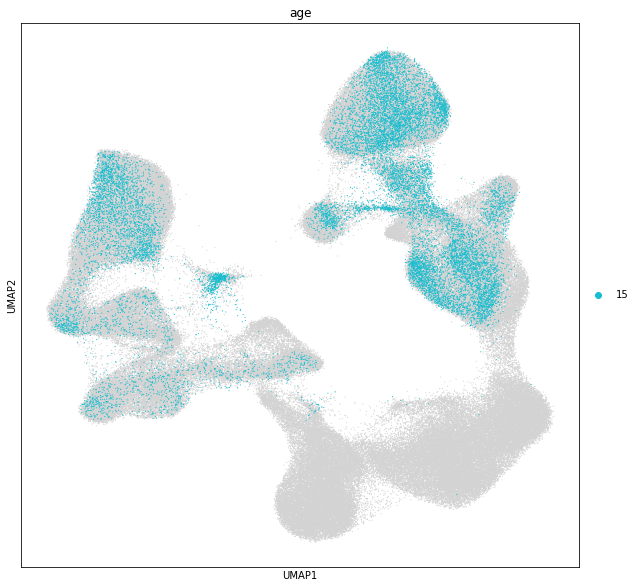

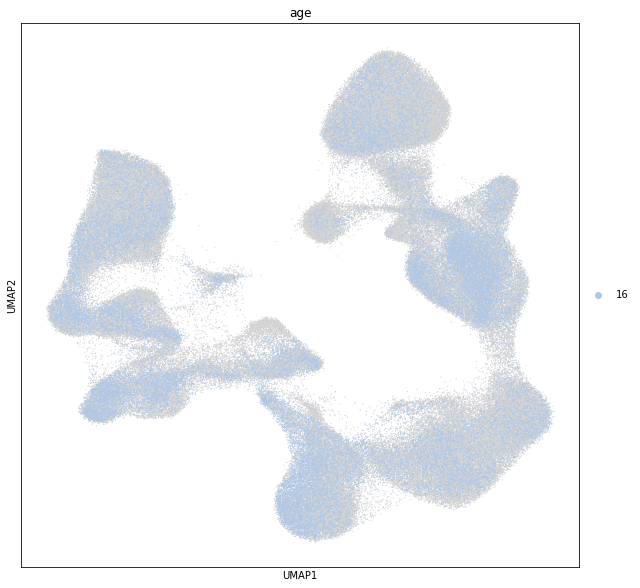

In [120]:
adata.obs["age"] = adata.obs["age"].astype("category")
for a in range(4,17):
    if a in adata.obs["age"].unique():
        sc.pl.umap(adata, color=["age"], groups=[a], size=5)

In [22]:
def _compute_connectivity(adata, vals, obs_col="age", obsp_key=""):
    obs1,obs2 = adata.obs[obs_col]==vals[0],adata.obs[obs_col]==vals[1]
    if len(obsp_key) > 0:
        mean_conn = adata.obsp[obsp_key + "_connectivities"][obs1,][:,obs2].count_nonzero()
        cmat_shape = adata.obsp["connectivities"][obs1,][:,obs2].shape
    else:
        mean_conn = adata.obsp["connectivities"][obs1,][:,obs2].count_nonzero()
        cmat_shape = adata.obsp["connectivities"][obs1,][:,obs2].shape
    return(mean_conn )

In [55]:
obs_col = "bbk"
values = np.sort(adata.obs[obs_col].dropna().unique())
mean_conn_mat = np.zeros(shape=(values.shape[0], values.shape[0]))

for i in range(len(values)):
    for j in range(len(values)): 
        mean_conn_mat[i,j] = _compute_connectivity(adata, (values[i],values[j]), obs_col=obs_col)

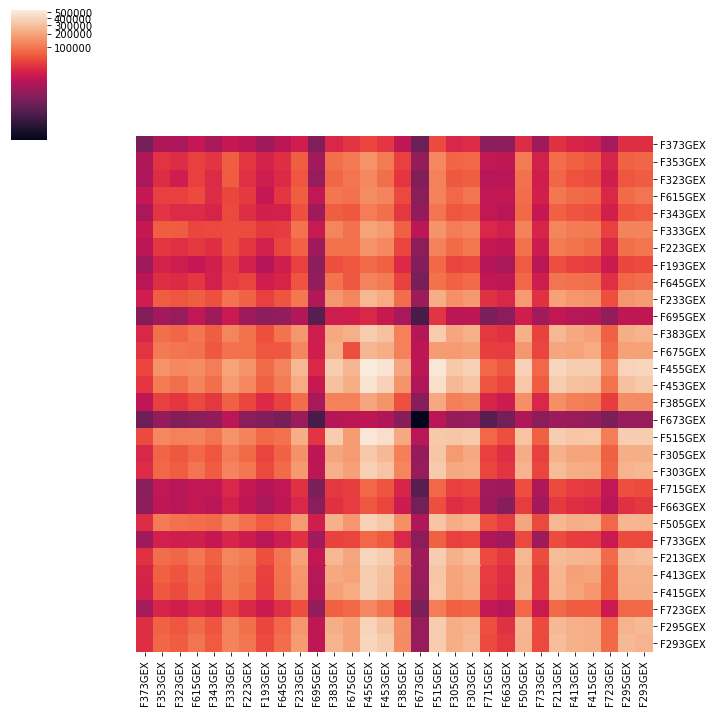

In [56]:
bbknn_conn_df = pd.DataFrame(mean_conn_mat, index=values, columns=values)
# np.fill_diagonal(conn_df.values, 0)

sorting_obs = "age"
sorted_bbk = adata.obs[[sorting_obs, obs_col]].drop_duplicates().sort_values(sorting_obs)[obs_col].values
bbknn_conn_df = bbknn_conn_df.loc[sorted_bbk,sorted_bbk]

sns.clustermap(bbknn_conn_df, col_cluster=False, row_cluster=False,
            norm=matplotlib.colors.PowerNorm(gamma=1. / 5.)
           )

### Directed BBKNN

Adding 'time-aware' component: batches have more edges with batches that are closer in time and less with others

In [37]:
# sample_ixs=np.array([])
# for b in adata.obs["bbk"].unique():
#     ixs = np.where(adata.obs['bbk']==b)[0]
#     small_ixs = np.random.choice(ixs, int(np.round(len(ixs)/2)))
#     sample_ixs = np.append(sample_ixs, small_ixs)

# small_adata = adata[[int(x) for x in sample_ixs]].copy()
small_adata=adata.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [38]:
import directed_bbknn
directed_bbknn.directed_bbknn(small_adata, batch_key="bbk", sorting_key="age", tot_neighbors=50)

In [39]:
small_adata.obsp["directedBBKNN_connectivities"] = small_adata.obsp["connectivities"]
small_adata.obsp["directedBBKNN_distances"] = small_adata.obsp["distances"]

In [40]:
obs_col = "bbk"
values = np.sort(small_adata.obs[obs_col].dropna().unique())
mean_conn_mat = np.zeros(shape=(values.shape[0], values.shape[0]))

for i in range(len(values)):
    for j in range(len(values)): 
        mean_conn_mat[i,j] = _compute_connectivity(small_adata, (values[i],values[j]), obs_col=obs_col, obsp_key="directedBBKNN")

In [41]:
conn_df = pd.DataFrame(mean_conn_mat, index=values, columns=values)
# np.fill_diagonal(conn_df.values, 0)

sorting_obs = "age"
sorted_bbk = small_adata.obs[[sorting_obs, obs_col]].drop_duplicates().sort_values(sorting_obs)[obs_col].values
conn_df = conn_df.loc[sorted_bbk,sorted_bbk]

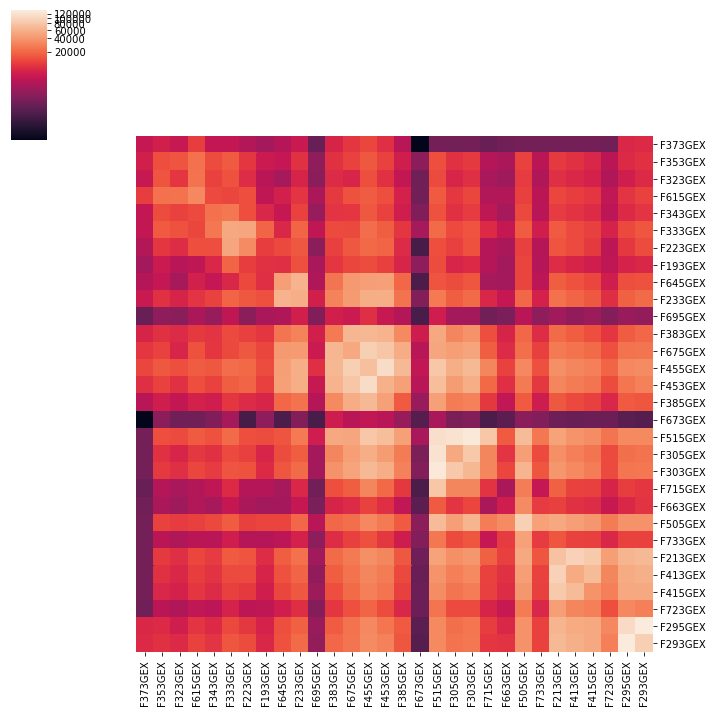

In [42]:
sns.clustermap(conn_df, col_cluster=False, row_cluster=False,
            norm=matplotlib.colors.PowerNorm(gamma=1. / 5.)
           )

## Visualize results

In [43]:
small_adata.uns["directedBBKNN"] = small_adata.uns["neighbors"]

In [44]:
sc.tl.umap(small_adata, neighbors_key="directedBBKNN")

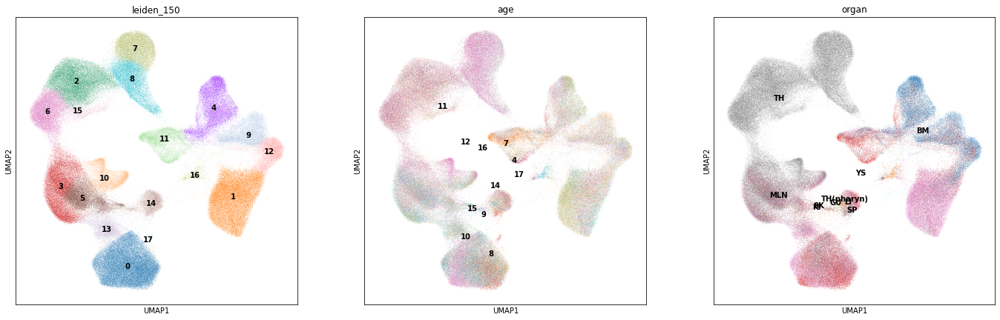

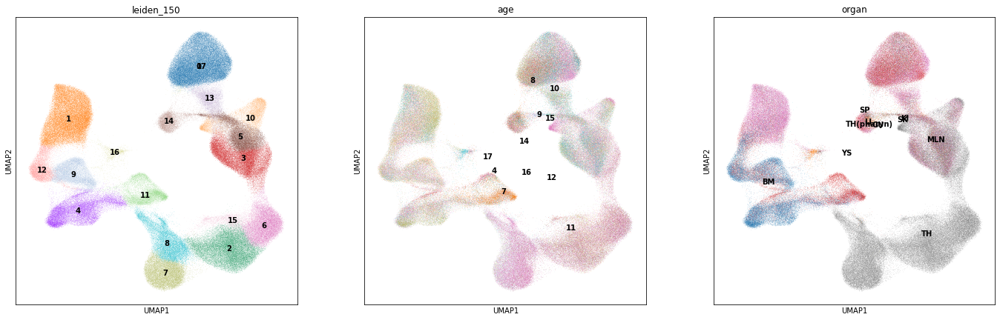

In [45]:
sc.pl.umap(small_adata, color=["leiden_150", "age","organ"], legend_loc="on data")
sc.pl.umap(adata, color=["leiden_150", "age","organ"], legend_loc="on data")

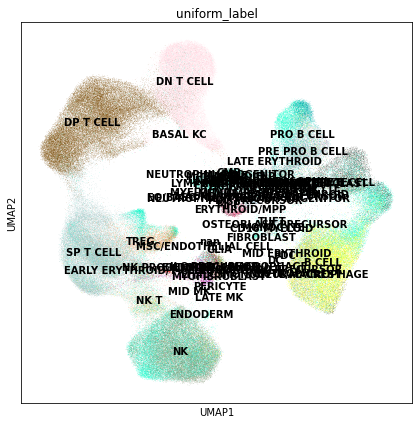

In [46]:
sc.pl.umap(small_adata, color=["uniform_label"], legend_loc="on data")

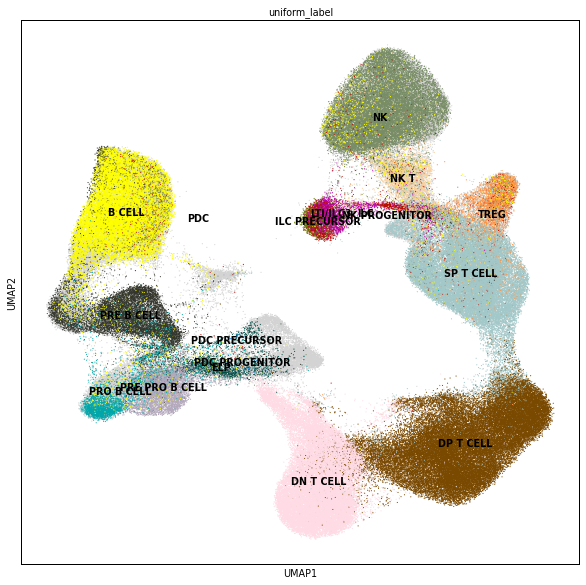

In [172]:
sns.set_context('paper')
sc.pl.umap(adata, color=['uniform_label'], legend_loc="on data", size=5,
               groups=adata.obs['uniform_label'][adata.obs['uniform_label_lvl0'] == "LYMPHOID"].unique())

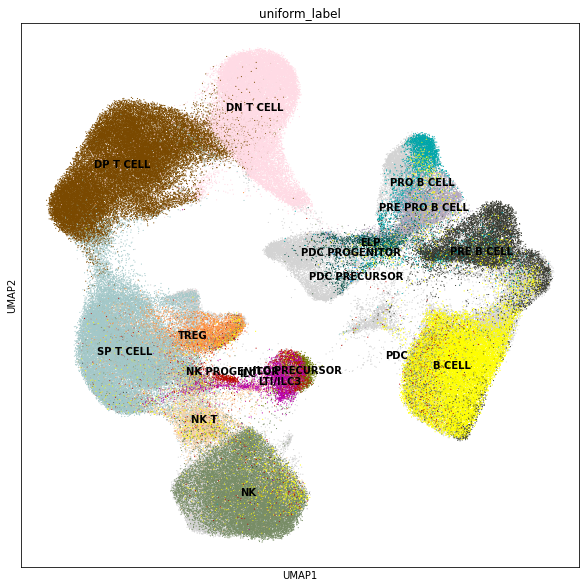

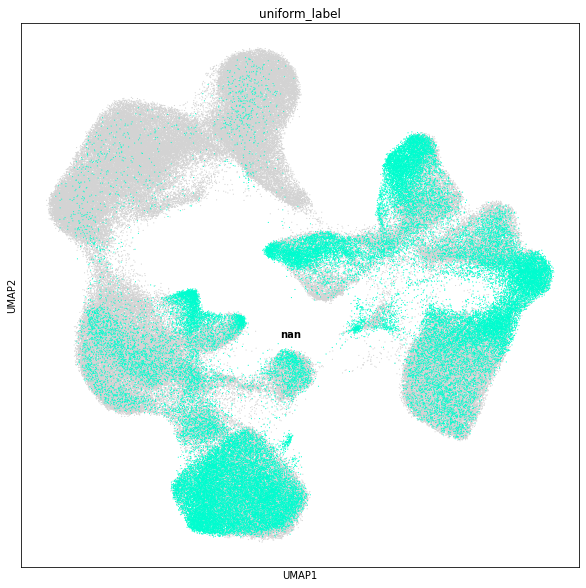

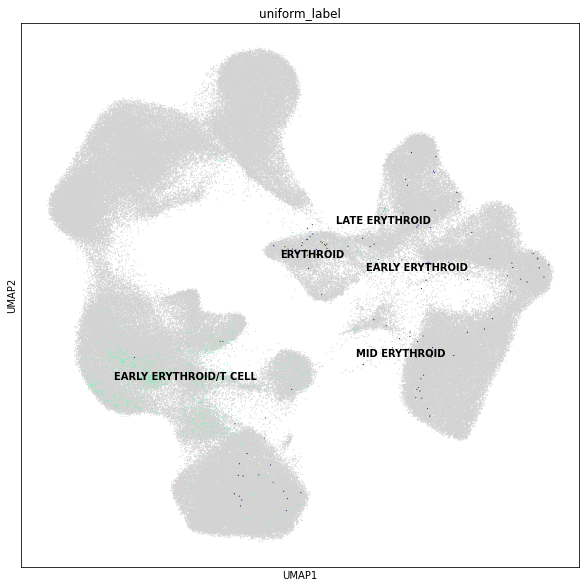

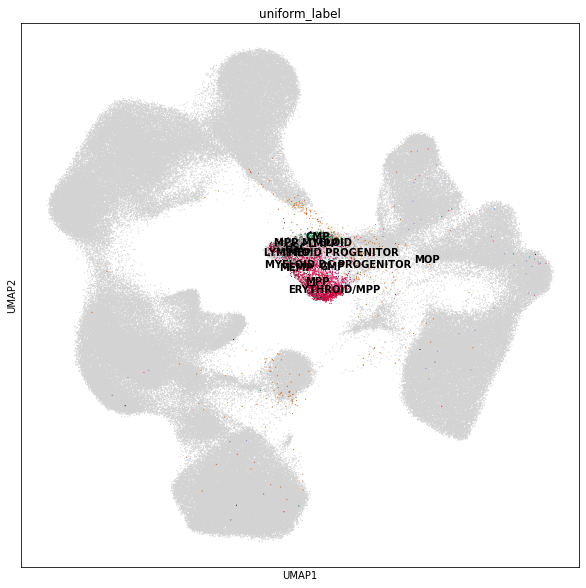

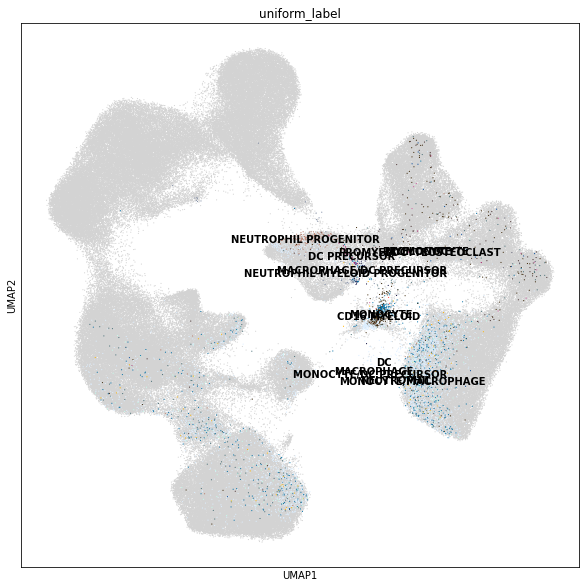

...

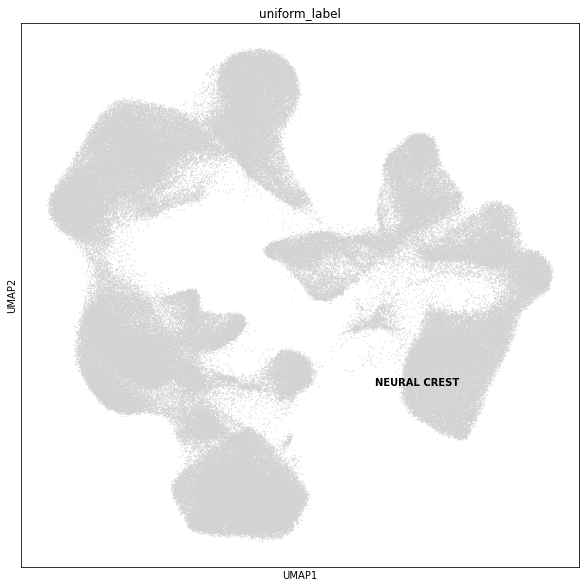

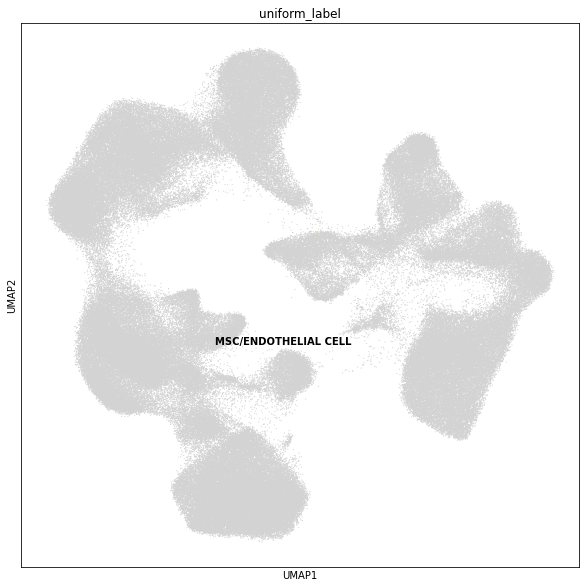

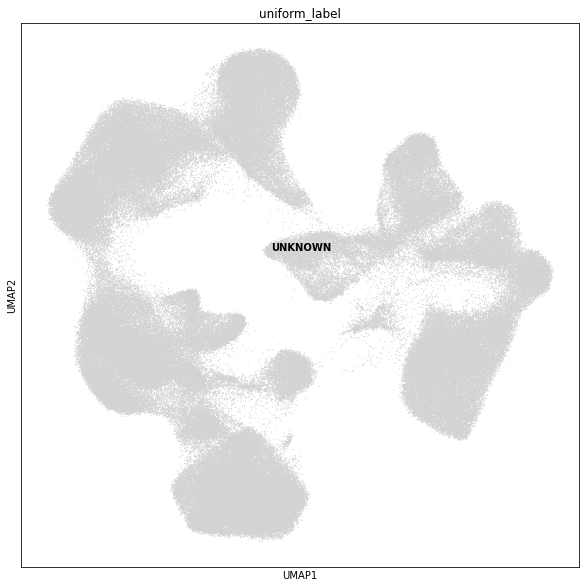

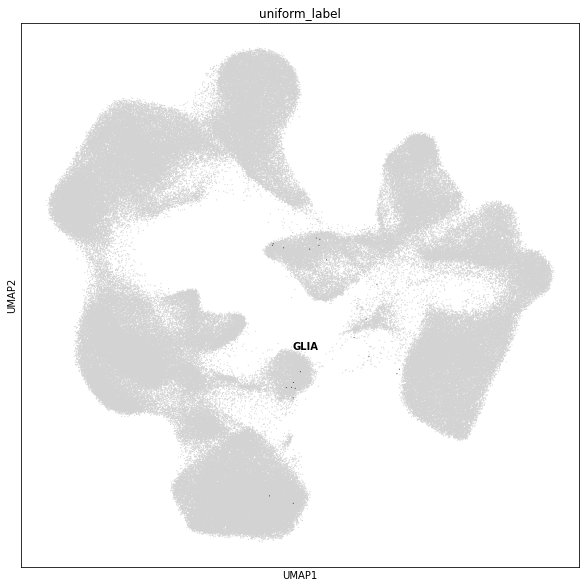

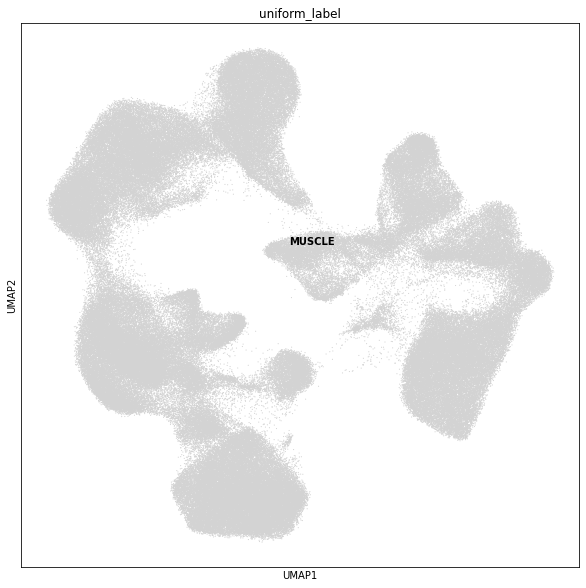

In [57]:
plt.rcParams["figure.figsize"] = [10,10]
for o in adata.obs['uniform_label_lvl0'].unique():
    sc.pl.umap(small_adata, color=['uniform_label'], legend_loc="on data", size=5,
               groups=small_adata.obs['uniform_label'][small_adata.obs['uniform_label_lvl0'] == o].unique())

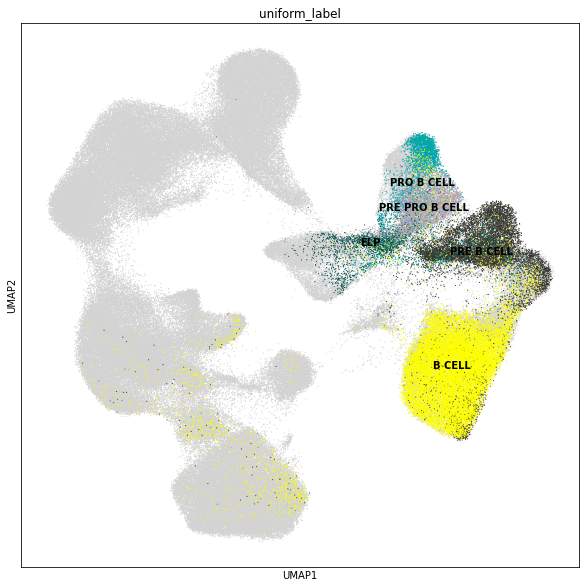

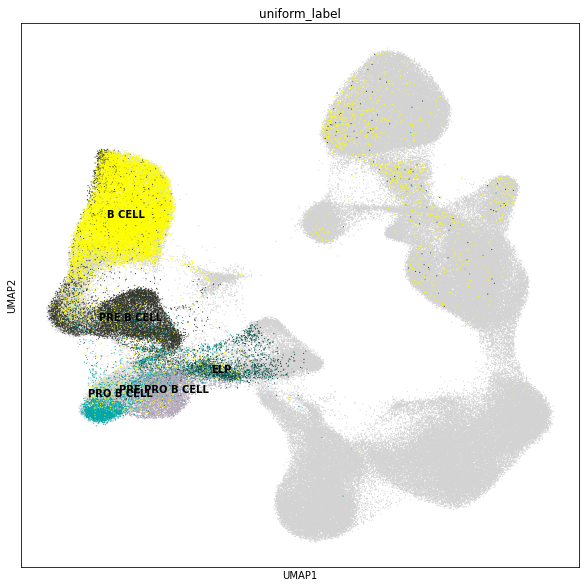

In [61]:
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.umap(small_adata, color=['uniform_label'], legend_loc="on data", size=5,
               groups=['B CELL', "PRE PRO B CELL", "PRE B CELL", "PRO B CELL", "ELP"])
sc.pl.umap(adata, color=['uniform_label'], legend_loc="on data", size=5,
               groups=['B CELL', "PRE PRO B CELL", "PRE B CELL", "PRO B CELL", "ELP"])

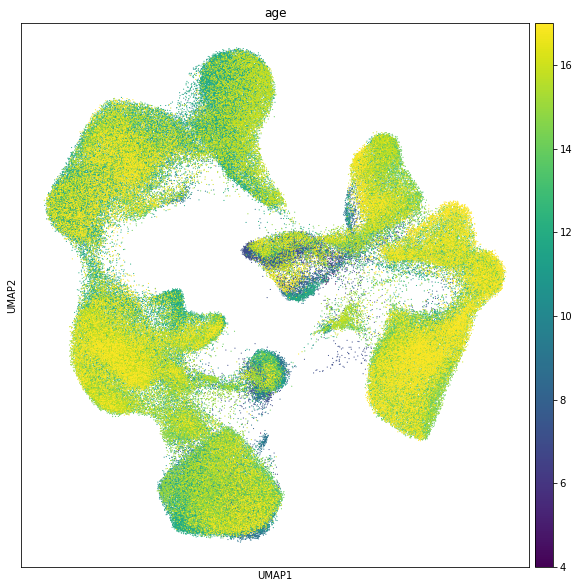

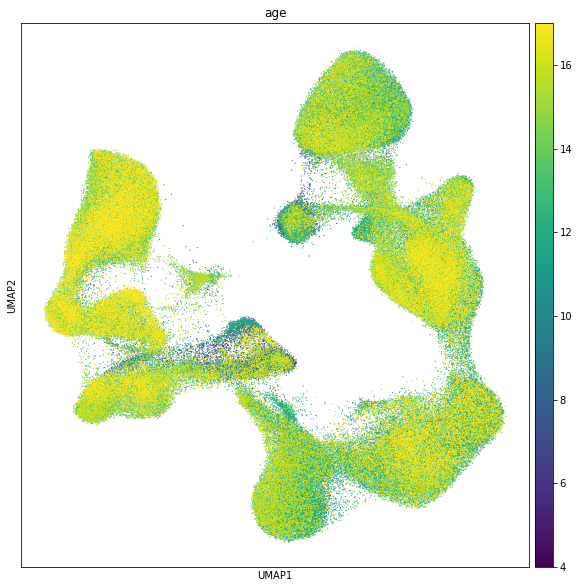

In [64]:
small_adata.obs["age"] = small_adata.obs["age"].astype("int")
adata.obs["age"] = adata.obs["age"].astype("int")
sc.pl.umap(small_adata, color=['age'], size=5)
sc.pl.umap(adata, color=['age']      , size=5)

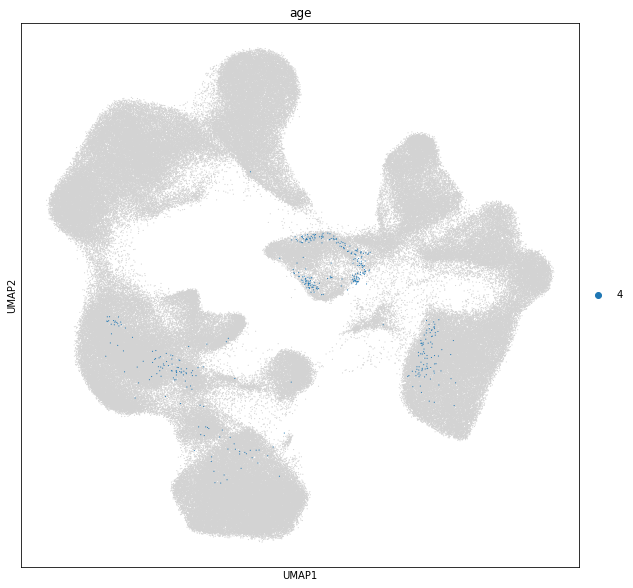

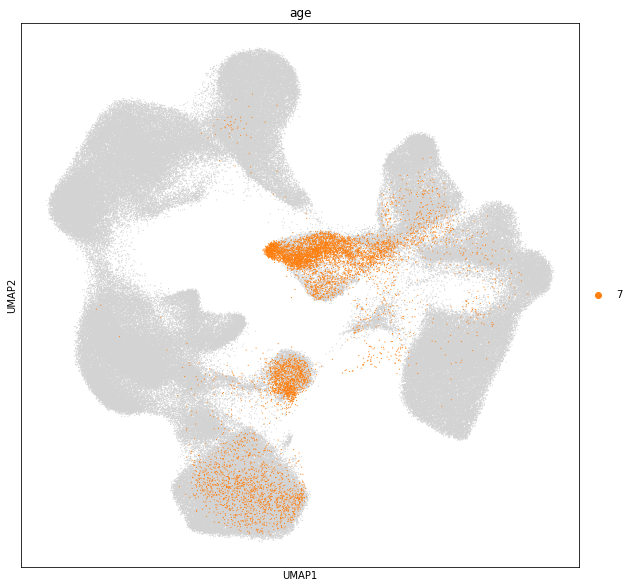

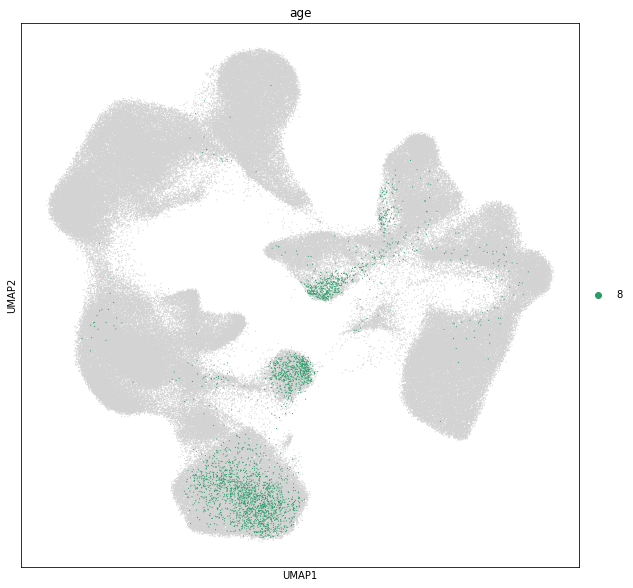

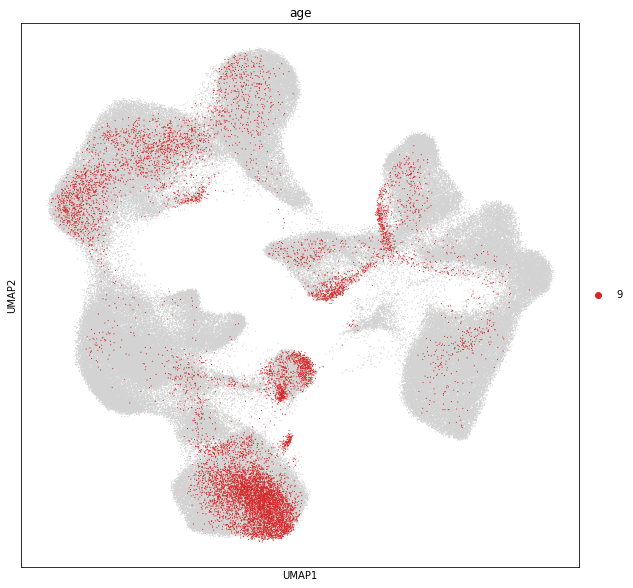

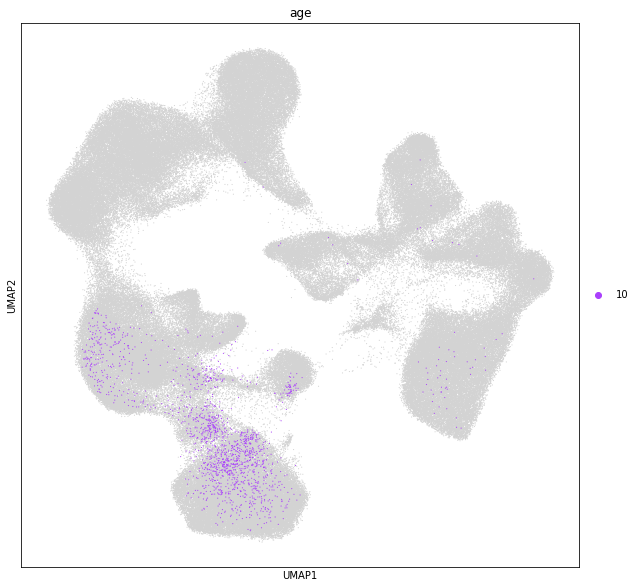

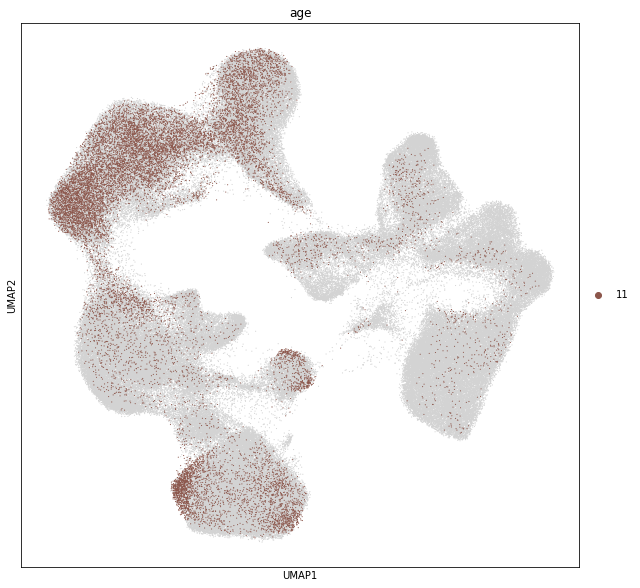

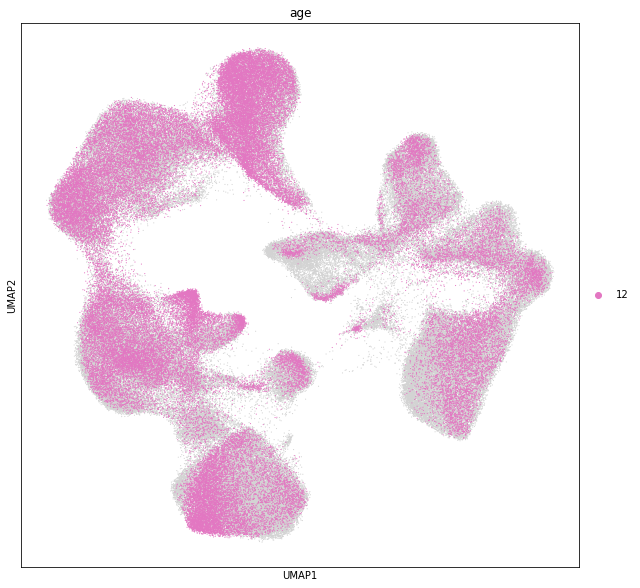

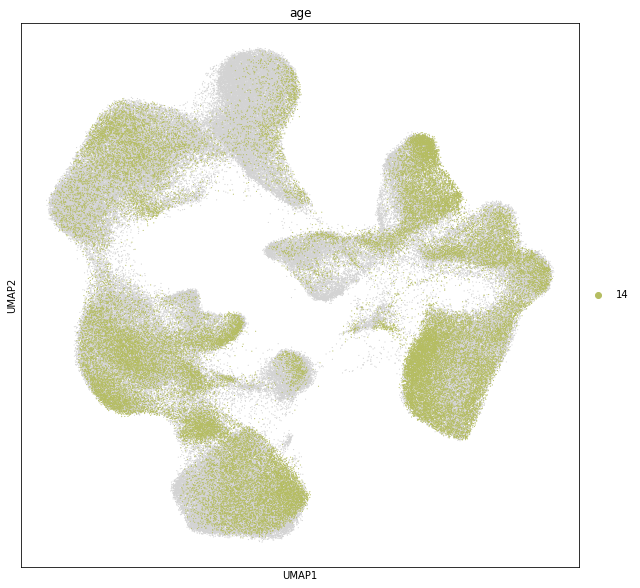

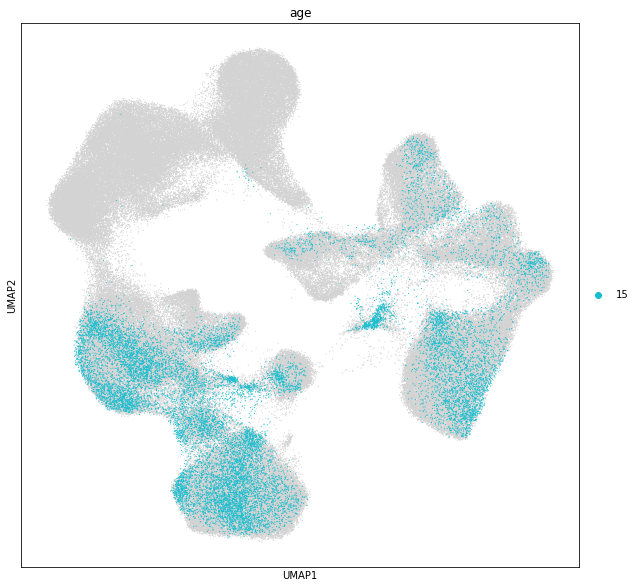

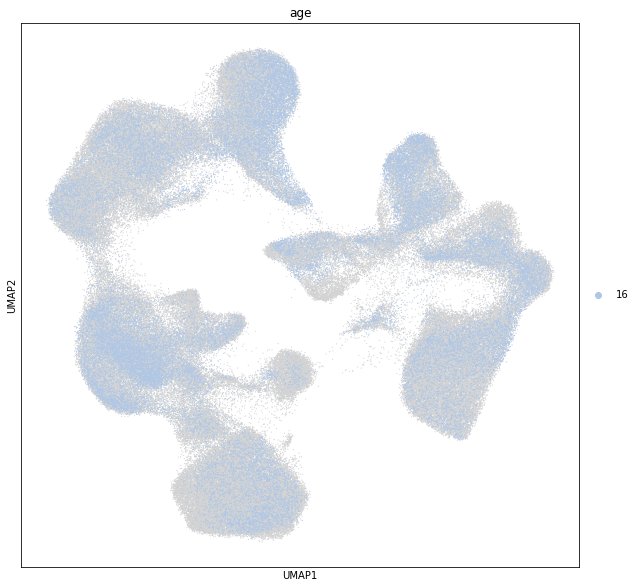

In [118]:
small_adata.obs["age"] = small_adata.obs["age"].astype("category")
for a in range(4,17):
    if a in small_adata.obs["age"].unique():
        sc.pl.umap(small_adata, color=["age"], groups=[a], size=5)

In [65]:
sc.tl.diffmap(adata, n_comps=5)

In [66]:
sc.tl.diffmap(small_adata, n_comps=5)

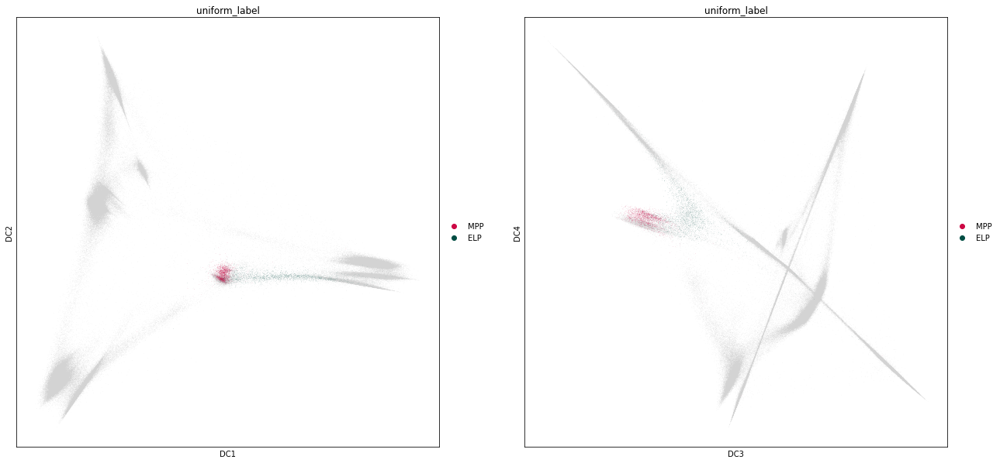

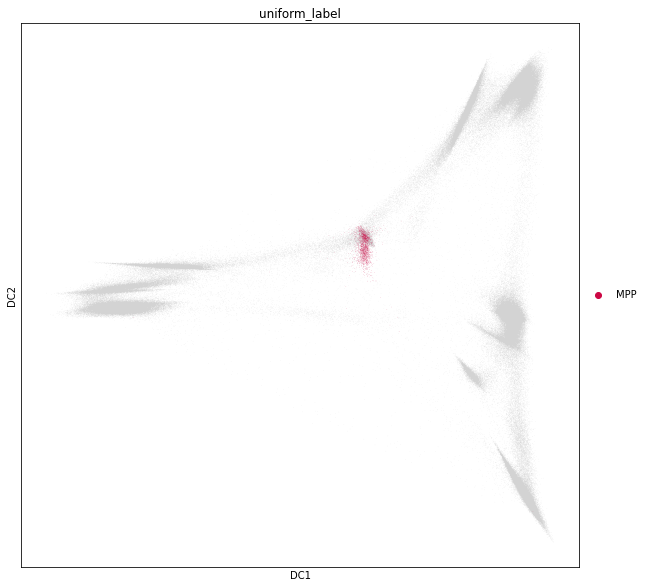

In [78]:
sc.pl.diffmap(small_adata, components=["1,2",'3,4'],color="uniform_label", groups=["MPP", "ELP"])
sc.pl.diffmap(adata, color="uniform_label", groups=["MPP"])


In [86]:
adata.uns['iroot'] = np.where((adata.obs["uniform_label"]=="MPP") & (adata.obs["age"]==4))[0][0]
small_adata.uns['iroot'] = np.where((adata.obs["uniform_label"]=="MPP") & (adata.obs["age"]==4))[0][0]

In [88]:
sc.tl.dpt(adata, n_dcs=5)
sc.tl.dpt(small_adata, n_dcs=5)

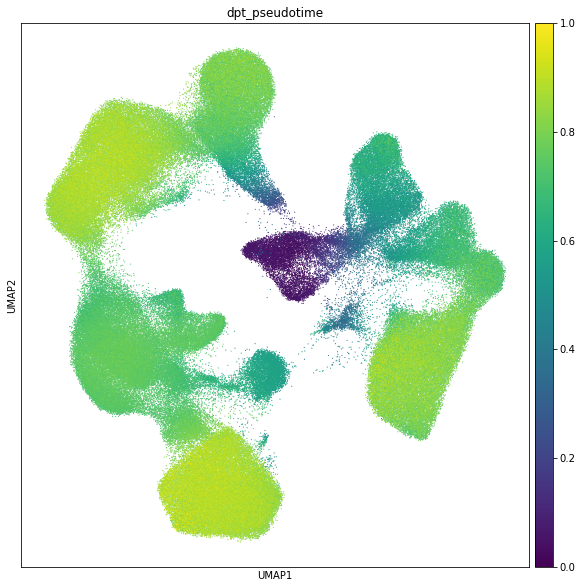

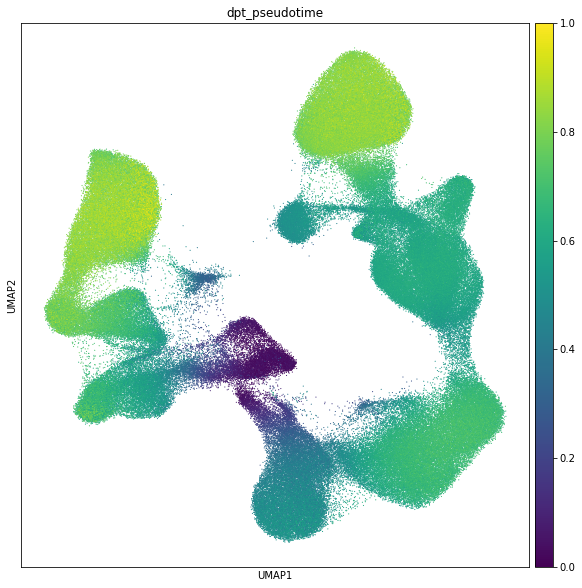

In [89]:
sc.pl.umap(small_adata, color=['dpt_pseudotime'], size=5)
sc.pl.umap(adata, color=['dpt_pseudotime']      , size=5)

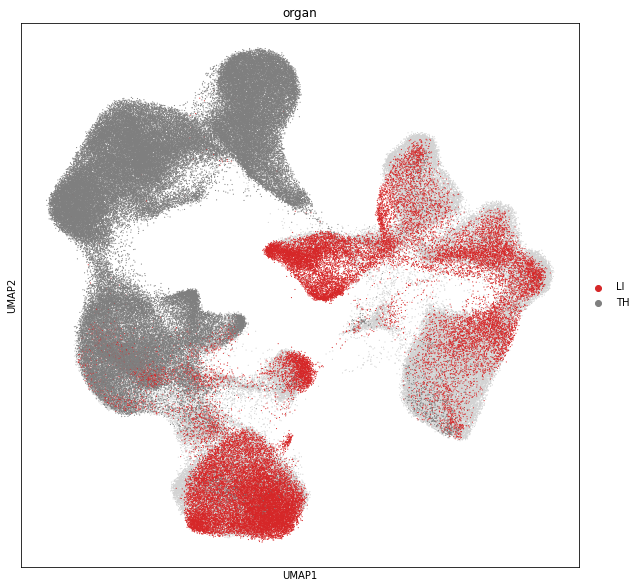

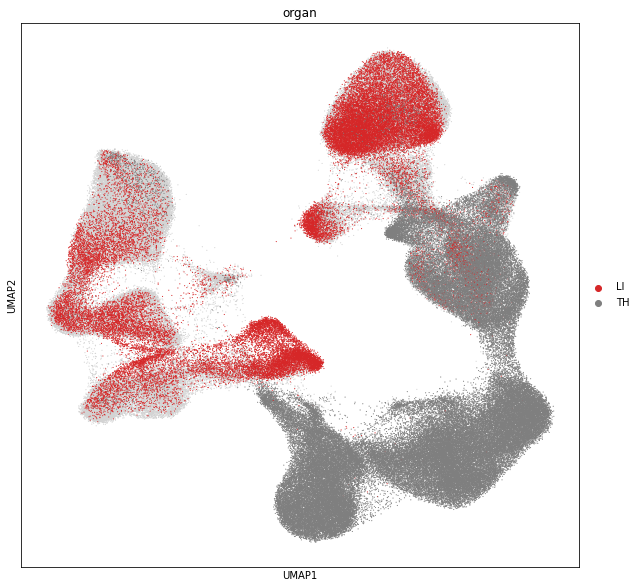

In [162]:
sc.pl.umap(small_adata, color=['organ'], groups=["LI", "TH"], size=5)
sc.pl.umap(adata, color=['organ'], groups=["LI", "TH"]      , size=5)

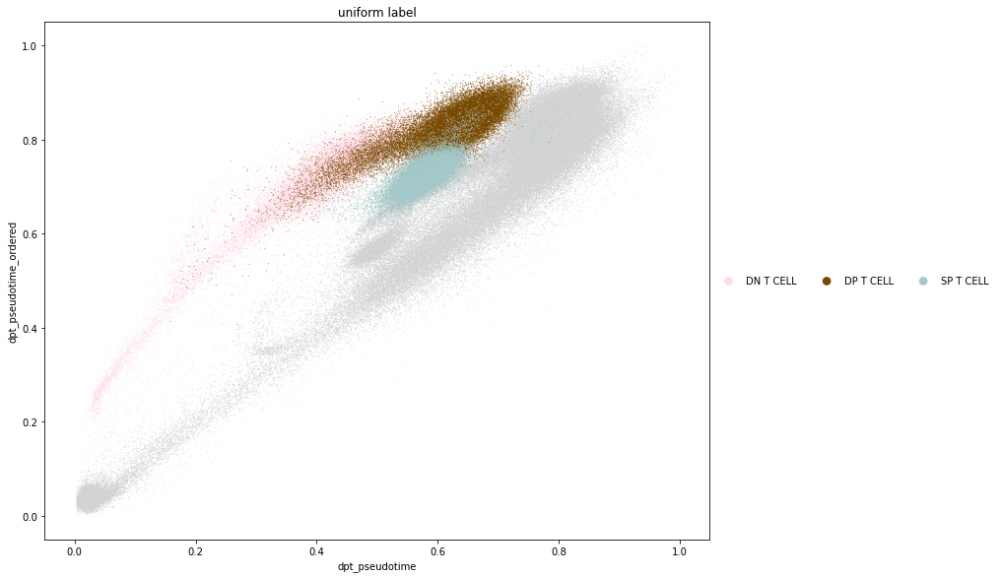

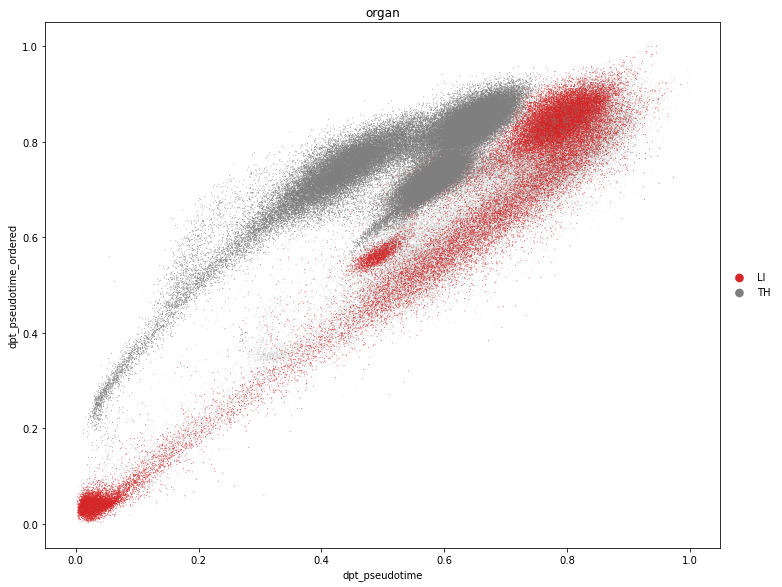

In [164]:
adata.obs["dpt_pseudotime_ordered"] = small_adata.obs["dpt_pseudotime"]
sc.pl.scatter(adata, "dpt_pseudotime", "dpt_pseudotime_ordered", color='uniform_label', groups=["DN T CELL", "DP T CELL", "SP T CELL"], size=3)
sc.pl.scatter(adata, "dpt_pseudotime", "dpt_pseudotime_ordered",  color='organ', groups=["LI", "TH"], size=3)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


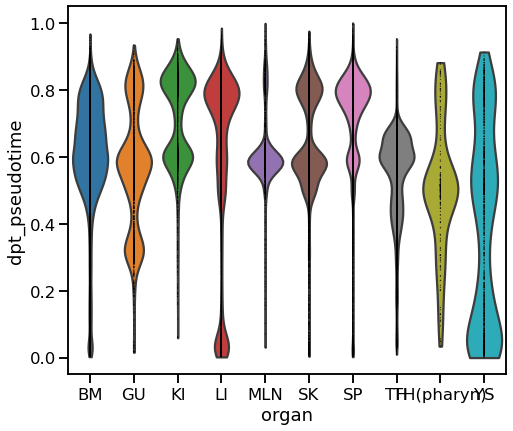

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


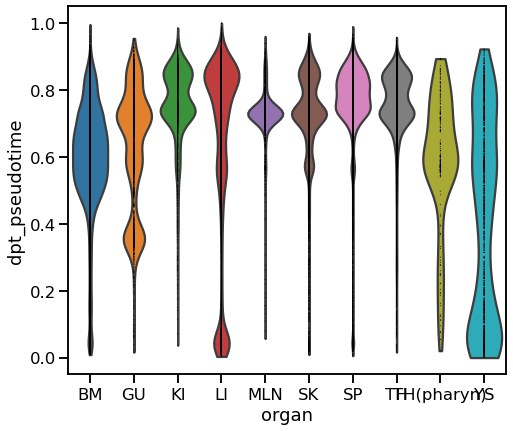

In [173]:
sns.set_context("talk")
plt.rcParams["figure.figsize"] = [7,7]
sc.pl.violin(adata, "dpt_pseudotime", groupby='organ', jitter=False)
sc.pl.violin(small_adata, "dpt_pseudotime", groupby='organ', jitter=False)

In [92]:
import panfetal_utils

In [93]:
panfetal_utils._propagate_labels(adata, "uniform_label")
panfetal_utils._propagate_labels(small_adata, "uniform_label")

In [99]:
%load_ext rpy2.ipython

In [114]:
%%R
library(tidyverse)
library(ggplot2)
library(patchwork)

In [147]:
bbknn_df = adata.obs[["uniform_label", "dpt_pseudotime", "uniform_label_lvl0", 'organ']].sort_values("dpt_pseudotime")
ordered_bbknn_df = small_adata.obs[["uniform_label", "dpt_pseudotime", "uniform_label_lvl0", "organ"]].sort_values("dpt_pseudotime")

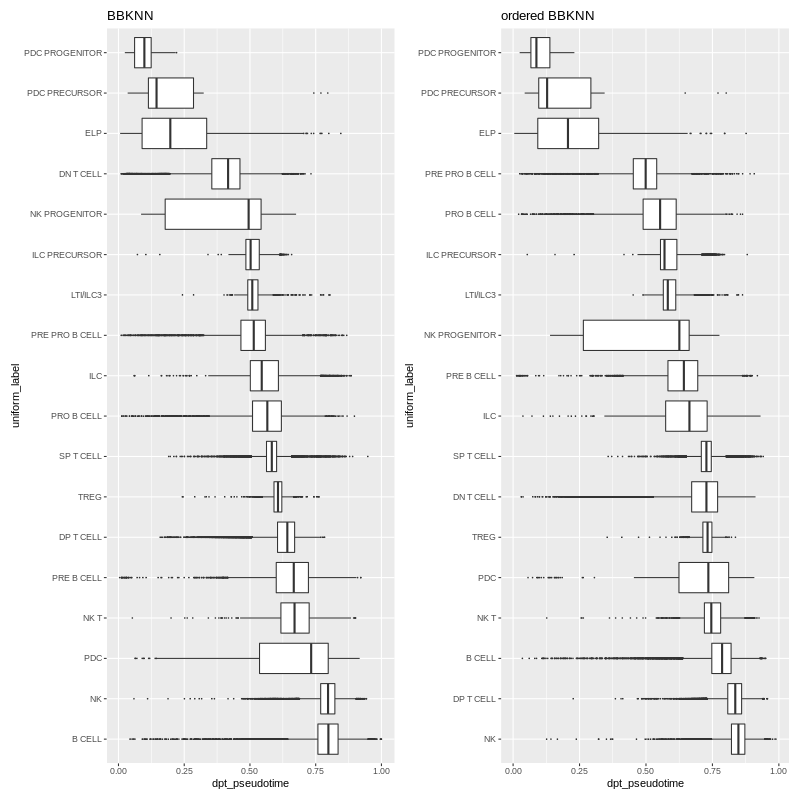

In [148]:
%%R -i bbknn_df -i ordered_bbknn_df -w 800 -h 800
bbknn_df %>%
filter(uniform_label_lvl0 == "LYMPHOID") %>%
group_by(uniform_label) %>%
mutate(mean_dpt=median(dpt_pseudotime)) %>%
ungroup() %>%
arrange(- mean_dpt) %>%
mutate(uniform_label = factor(uniform_label, levels=unique(uniform_label))) %>%
ggplot(aes(uniform_label, dpt_pseudotime)) + 
geom_boxplot(outlier.size=0.1) +
coord_flip() +
ggtitle("BBKNN") +

ordered_bbknn_df %>%
filter(uniform_label_lvl0 == "LYMPHOID") %>%
group_by(uniform_label) %>%
mutate(mean_dpt=median(dpt_pseudotime)) %>%
ungroup() %>%
arrange(- mean_dpt) %>%
mutate(uniform_label = factor(uniform_label, levels=unique(uniform_label))) %>%
ggplot(aes(uniform_label, dpt_pseudotime)) + 
geom_boxplot(outlier.size=0.1) +
ggtitle("ordered BBKNN") +
coord_flip()

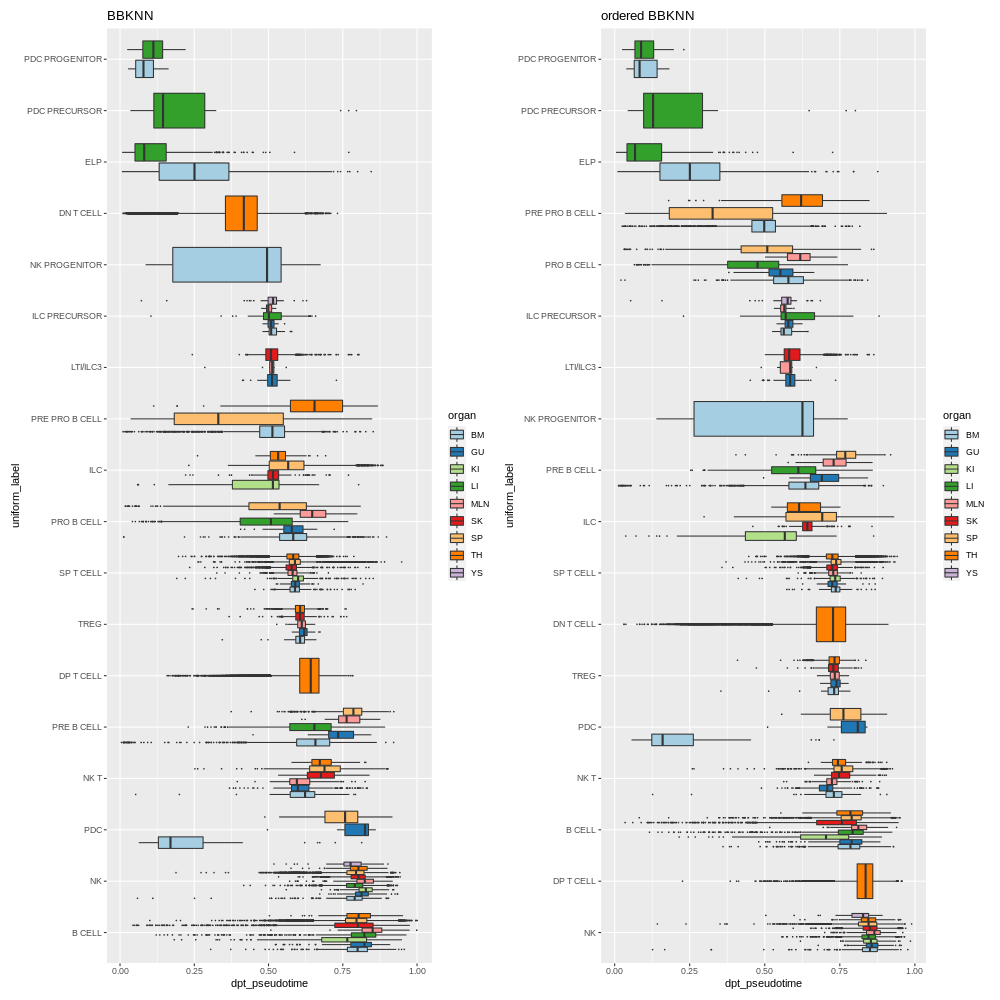

In [161]:
%%R  -w 1000 -h 1000
bbknn_df %>%
filter(uniform_label_lvl0 == "LYMPHOID") %>%
group_by(uniform_label) %>%
mutate(mean_dpt=median(dpt_pseudotime)) %>%
ungroup() %>%
arrange(- mean_dpt) %>%
mutate(uniform_label = factor(uniform_label, levels=unique(uniform_label))) %>%
ggplot(aes(uniform_label, dpt_pseudotime, fill=organ)) + 
geom_boxplot(outlier.size=0.1) +
coord_flip() +
# facet_grid(organ~.) +
scale_fill_brewer(palette="Paired") +
ggtitle("BBKNN") +

ordered_bbknn_df %>%
filter(uniform_label_lvl0 == "LYMPHOID") %>%
group_by(uniform_label) %>%
mutate(mean_dpt=median(dpt_pseudotime)) %>%
ungroup() %>%
arrange(- mean_dpt) %>%
mutate(uniform_label = factor(uniform_label, levels=unique(uniform_label))) %>%
ggplot(aes(uniform_label, dpt_pseudotime, fill=organ)) + 
geom_boxplot(outlier.size=0.1) +
ggtitle("ordered BBKNN") +
scale_fill_brewer(palette="Paired") +
coord_flip() 

In [48]:
age_counts_df = adata.obs[['bbk',"age"]].value_counts(sort=False).reset_index()

Text(0, 0.5, '# cells')

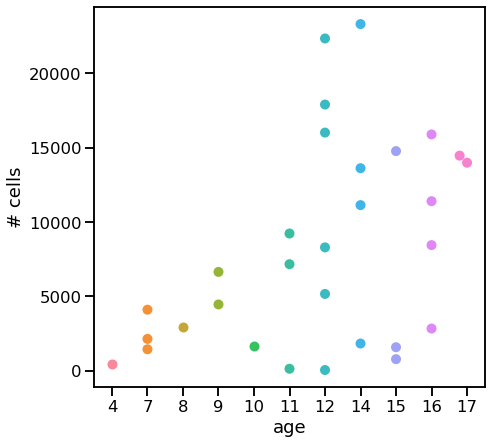

In [178]:
sns.swarmplot(data=age_counts_df, x="age", y=0, size=10);
plt.ylabel("# cells")


### NKT dataset